In [1]:
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt

In [100]:
scale_modifier = 1.0
SH_C0 = 0.28209479177387814
SH_C1 = 0.4886025119029199
SH_C2_0 = 1.0925484305920792
SH_C2_1 = -1.0925484305920792
SH_C2_2 = 0.31539156525252005
SH_C2_3 = -1.0925484305920792
SH_C2_4 = 0.5462742152960396
SH_C3_0 = -0.5900435899266435
SH_C3_1 = 2.890611442640554
SH_C3_2 = -0.4570457994644658
SH_C3_3 = 0.3731763325901154
SH_C3_4 = -0.4570457994644658
SH_C3_5 = 1.445305721320277
SH_C3_6 = -0.5900435899266435

In [101]:
class Gaussian:
    def __init__(self, pos, scale, rot, opacity, sh):
        self.pos = np.array(pos)
        self.scale = np.array(scale_modifier * scale)
        # Initialize scipy Quaternion from rot (s, x, y, z)
        self.rot = sp.spatial.transform.Rotation.from_quat([rot[1], rot[2], rot[3], rot[0]])
        self.opacity = opacity[0]
        self.sh = np.array(sh)
        self.cov3D = self.compute_cov3d()
        self.bbox = self.compute_bbox()
        self.iso_color = self.get_iso_color()

    def compute_cov3d(self):
        cov3D = np.diag(self.scale**2)
        cov3D = self.rot.as_matrix().T @ cov3D @ self.rot.as_matrix()
        return cov3D
    
    def compute_bbox(self):
        # Eigen decomposition of the covariance matrix
        eigenvalues, eigenvectors = np.linalg.eigh(self.cov3D)
        
        # Compute the standard deviations along the principal axes
        std_devs = np.sqrt(eigenvalues)
        
        # Compute the 3-sigma values for each principal axis
        three_sigma_values = 3 * std_devs
        
        # Compute the bounding box in the principal axis coordinates
        # This assumes the Gaussian is oriented along the principal axes
        bounding_box_offsets = np.array([[-1.0, -1.0, -1.0], [1.0, -1.0, -1.0], [1.0, 1.0, -1.0], [-1.0, 1.0, -1.0], 
                                        [-1.0, -1.0, 1.0], [1.0, -1.0, 1.0], [1.0, 1.0, 1.0], [-1.0, 1.0, 1.0]])
        bounding_box_offsets *= three_sigma_values
        
        # Rotate the bounding box back to the original coordinate system
        # and translate it to the Gaussian's center
        vertices = np.dot(bounding_box_offsets, eigenvectors) + self.pos
        return np.array(vertices)
    
    def get_iso_color(self) -> np.ndarray:
        """Samples spherical harmonics to get color for given view direction"""
        c0 = self.sh[0:3]   # f_dc_* from the ply file)
        color = SH_C0 * c0
        color += 0.5
        return np.clip(color, 0.0, 1.0)
    
    def compute_blob_ellipsoid(self):
        # Compute eigenvalues and eigenvectors of the covariance matrix
        eigenvalues, eigenvectors = np.linalg.eigh(self.cov3D)
        
        # Get the radii of the ellipsoid
        radii = np.sqrt(eigenvalues)*3
        
        # Generate data for the ellipsoid surface
        u = np.linspace(0.0, 2.0 * np.pi, 100)
        v = np.linspace(0.0, np.pi, 100)
        x = radii[0] * np.outer(np.cos(u), np.sin(v))
        y = radii[1] * np.outer(np.sin(u), np.sin(v))
        z = radii[2] * np.outer(np.ones_like(u), np.cos(v))
        
        # Rotate and translate the points to the correct position
        for i in range(len(x)):
            for j in range(len(x)):
                [x[i,j], y[i,j], z[i,j]] = np.dot([x[i,j], y[i,j], z[i,j]], eigenvectors) + self.pos
        
        return x,y,z

    def get_cov2d(self, camera):
        view_mat = camera.get_view_matrix()
        g_pos_w = np.append(self.pos, 1.0)
        # g_pos_cam = camera.world_to_cam(self.pos)
        g_pos_cam = view_mat @ g_pos_w
        view_matrix = camera.get_view_matrix()
        [htan_fovx, htan_fovy, focal] = camera.get_htanfovxy_focal()
        focal_x = focal_y = focal

        t = np.copy(g_pos_cam)

        limx = 1.3 * htan_fovx
        limy = 1.3 * htan_fovy
        txtz = t[0]/t[2]
        tytz = t[1]/t[2]

        tx = min(limx, max(-limx, txtz)) * t[2]
        ty = min(limy, max(-limy, tytz)) * t[2]
        tz = t[2]

        J = np.array([
            [focal_x/tz, 0.0, -(focal_x * tx)/(tz * tz)],
            [0.0, focal_y/tz, -(focal_y * ty)/(tz * tz)],
            [0.0, 0.0, 0.0]
        ])
        W = view_matrix[:3, :3].T
        T = W @ J
        cov = T.T @ self.cov3D.T @ T

        cov[0,0] += 0.3
        cov[1,1] += 0.3
        return cov[:2, :2]

    def get_depth(self, camera):
        view_matrix = camera.get_view_matrix()
        
        position4 = np.append(self.pos, 1.0)
        g_pos_view = view_matrix @ position4
        depth = g_pos_view[2]
        return depth

    def get_conic_and_bb(self, camera):
        # cov2d = self.get_cov2d(camera)
        cov2d = np.array([1,0,0,1]).reshape(2,2)

        det = np.linalg.det(cov2d)
        if det == 0.0:
            return None
        
        det_inv = 1.0 / det
        cov = [cov2d[0,0], cov2d[0,1], cov2d[1,1]]
        conic = np.array([cov[2] * det_inv, -cov[1] * det_inv, cov[0] * det_inv])
        # cov_inv= np.linalg.inv(cov2d)
        # conic = np.array([cov_inv[0,0], cov_inv[0,1], cov_inv[1,1]])
        # compute 3-sigma bounding box size
        # 3-sigma covers 99.7% of the distribution
        bboxsize_cam = np.array([3.0 * np.sqrt(cov2d[0,0]), 3.0 * np.sqrt(cov2d[1,1])])
        # bboxsize_cam = np.array([3.0 * np.sqrt(cov[0]), 3.0 * np.sqrt(cov[2])])        
        # Divide out camera plane size to get bounding box size in NDC
        # wh = np.array([camera.w, camera.h])
        wh = np.array([16,16])

        bboxsize_ndc = np.divide(bboxsize_cam, wh) * 2

        print("bboxsize_cam: ", bboxsize_cam)
        print("bboxsize_ndc: ", bboxsize_ndc)

        vertices = np.array([[-1, 1], [1, 1], [1, -1], [-1, -1]])
        # Four coordxy values (used to evaluate gaussian, also in camera space coordinates)
        bboxsize_cam = np.multiply(vertices, bboxsize_cam)

        print("bboxsize_cam: ", bboxsize_cam)

        # compute g_pos_screen and gl_position
        view_matrix = camera.get_view_matrix()
        projection_matrix = camera.get_projection_matrix()

        position4 = np.append(self.pos, 1.0)
        g_pos_view = view_matrix @ position4
        g_pos_screen = projection_matrix @ g_pos_view
        g_pos_screen = g_pos_screen / g_pos_screen[3]
        
        bbox_ndc = np.multiply(vertices, bboxsize_ndc) + g_pos_screen[:2]
        bbox_ndc = np.hstack((bbox_ndc, np.zeros((vertices.shape[0],2))))
        bbox_ndc[:,2:4] = g_pos_screen[2:4]

        return conic, bboxsize_cam, bbox_ndc

    def get_color(self, dir) -> np.ndarray:
        """Samples spherical harmonics to get color for given view direction"""
        c0 = self.sh[0:3]   # f_dc_* from the ply file)
        color = SH_C0 * c0

        shdim = len(self.sh)

        if shdim > 3:
            # Add the first order spherical harmonics
            c1 = self.sh[3:6]
            c2 = self.sh[6:9]
            c3 = self.sh[9:12]
    
            x = dir[0]
            y = dir[1]
            z = dir[2]
            color = color - SH_C1 * y * c1 + SH_C1 * z * c2 - SH_C1 * x * c3
            
        if shdim > 12:
            c4 = self.sh[12:15]
            c5 = self.sh[15:18]
            c6 = self.sh[18:21]
            c7 = self.sh[21:24]
            c8 = self.sh[24:27]
    
            (xx, yy, zz) = (x * x, y * y, z * z)
            (xy, yz, xz) = (x * y, y * z, x * z)
            
            color = color +	SH_C2_0 * xy * c4 + \
                SH_C2_1 * yz * c5 + \
                SH_C2_2 * (2.0 * zz - xx - yy) * c6 + \
                SH_C2_3 * xz * c7 + \
                SH_C2_4 * (xx - yy) * c8

        if shdim > 27:
            c9 = self.sh[27:30]
            c10 = self.sh[30:33]
            c11 = self.sh[33:36]
            c12 = self.sh[36:39]
            c13 = self.sh[39:42]
            c14 = self.sh[42:45]
            c15 = self.sh[45:48]
    
            color = color + \
                SH_C3_0 * y * (3.0 * xx - yy) * c9 + \
                SH_C3_1 * xy * z * c10 + \
                SH_C3_2 * y * (4.0 * zz - xx - yy) * c11 + \
                SH_C3_3 * z * (2.0 * zz - 3.0 * xx - 3.0 * yy) * c12 + \
                SH_C3_4 * x * (4.0 * zz - xx - yy) * c13 + \
                SH_C3_5 * z * (xx - yy) * c14 + \
                SH_C3_6 * x * (xx - 3.0 * yy) * c15
        
        color += 0.5
        return np.clip(color, 0.0, 1.0)


In [111]:
from ply2voxel import load_ply
model = load_ply('point_cloud.ply')
from tqdm import tqdm

print('Loading gaussians ...')
gaussian_objects = []
rots = []
scales = []
shs = []
for (pos, scale, rot, opacity, sh) in tqdm(zip(model.xyz, model.scale, model.rot, model.opacity, model.sh)):
    gaussian_objects.append(Gaussian(pos, scale, rot, opacity, sh))
    rots.append(rot)
    scales.append(scale)
    shs.append(sh)

Loading gaussians ...


373889it [00:09, 39741.49it/s]


In [161]:
features_dc = np.arange(12).reshape(4,1 ,3)
print(features_dc)
features_dc.transpose(1, 2).flatten()

[[[ 0  1  2]]

 [[ 3  4  5]]

 [[ 6  7  8]]

 [[ 9 10 11]]]


ValueError: axes don't match array

In [116]:
def inverse_iso_color_sh(target_color):
    target_color = np.array(target_color)
    target_color -=0.5
    c0 = target_color / SH_C0
    c0 = list(c0)
    return c0

In [119]:
pos_r = [0.3, 0, 0]
rot_r = np.array([1,0,0,0])
scale_r = np.array([0.1,0.1,0.1])
opacity_r = [1]
target_color = [1.0,0.0,0.0]
sh_r = inverse_iso_color_sh(target_color)
# sh_r = [0,0,0,0]
print(sh_r)
g_r = Gaussian(pos_r, scale_r, rot_r, opacity_r, sh_r)
print(g_r.iso_color)
print(g_r.cov3D)
print(g_r.bbox)
# plot_gaussian_ellipsoid(g_r.pos, g_r.cov3D, g_r.bbox ,g_r.iso_color)

[1.772453850905516, -1.772453850905516, -1.772453850905516]
[1. 0. 0.]
[[0.01 0.   0.  ]
 [0.   0.01 0.  ]
 [0.   0.   0.01]]
[[-5.55111512e-17 -3.00000000e-01 -3.00000000e-01]
 [ 6.00000000e-01 -3.00000000e-01 -3.00000000e-01]
 [ 6.00000000e-01  3.00000000e-01 -3.00000000e-01]
 [-5.55111512e-17  3.00000000e-01 -3.00000000e-01]
 [-5.55111512e-17 -3.00000000e-01  3.00000000e-01]
 [ 6.00000000e-01 -3.00000000e-01  3.00000000e-01]
 [ 6.00000000e-01  3.00000000e-01  3.00000000e-01]
 [-5.55111512e-17  3.00000000e-01  3.00000000e-01]]


In [150]:
sh = np.array([[1,2,3],[4,5,6],[7,8,9]])
print(sh)
print(sh.transpose(1, 2).flatten(start_dim=1))

[[1 2 3]
 [4 5 6]
 [7 8 9]]


AxisError: axis 2 is out of bounds for array of dimension 2

In [112]:
a = np.array([[1,-1,1],[2,3,3]])
b = a <0
b.sum(axis=1)

shs = np.array(shs)
neg_shs = shs < 0
neg_shs =neg_shs.sum(axis=1)
for i, n in enumerate(neg_shs):
    if n > 0:
        print(shs[i])

[-0.02758692 -0.84511095 -1.3146316 ]
[-1.1149654 -1.0284133 -0.9792022]
[-1.2126977 -1.214604  -1.2067413]
[ 1.8036503 -0.1437602 -1.8028493]
[-0.2755985 -1.1755421 -1.7754687]
[ 0.4571974  -0.34108073 -1.7783326 ]
[-0.9846412 -0.7102219 -0.4382951]
[ 0.09445362 -0.0666477   0.07355557]
[ 0.01470712 -0.47005102 -1.7818779 ]
[-0.41776055 -0.5943755  -0.74966085]
[ 0.01961461 -0.07172224 -0.28359154]
[-0.10406732 -0.4165484  -0.25777632]
[-0.07786667 -0.24327277 -0.6075138 ]
[ 0.513006   -0.39208642 -1.4805288 ]
[-1.776431  -1.7739538 -1.6997933]
[ 0.16940749 -0.15663435 -0.73047274]
[ 0.9095337   0.02719856 -1.0384054 ]
[ 2.0888708  1.4025578 -1.5699793]
[-1.0960075 -0.9516707 -0.6338933]
[-1.0688568   0.31599388 -0.21380761]
[ 0.34786454 -0.6012219  -1.7763866 ]
[-0.2767406  -0.42066917 -0.51976174]
[ 0.5967471   0.04578641 -1.7755721 ]
[-0.90110624 -0.8682944  -0.9184272 ]
[-0.45325726 -0.36513644 -0.48533085]
[ 0.27075088  0.11911736 -0.00162052]
[-1.0068606  -0.5997912  -0.14346552

In [33]:
print(type(rot[0]))

<class 'numpy.float32'>


In [5]:
gaussian_objects[0].bbox

array([[0.1073921 , 0.45574452, 0.13991245],
       [0.10732346, 0.45590232, 0.13988489],
       [0.10068908, 0.45564525, 0.15493853],
       [0.10075772, 0.45548746, 0.15496608],
       [0.28352943, 0.54618544, 0.21908348],
       [0.28346079, 0.54634324, 0.21905593],
       [0.27682641, 0.54608617, 0.23410956],
       [0.27689505, 0.54592837, 0.23413711]])

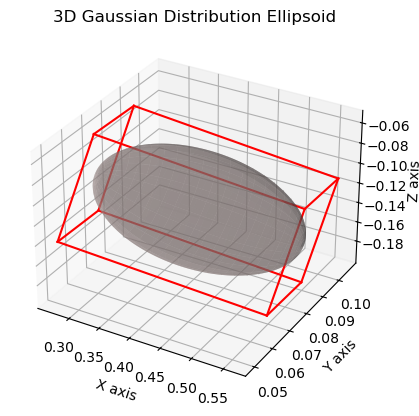

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_gaussian_ellipsoid(mean, cov, vertices,color):
    # Compute eigenvalues and eigenvectors of the covariance matrix
    eigenvalues, eigenvectors = np.linalg.eigh(cov)
    
    # Get the radii of the ellipsoid
    radii = np.sqrt(eigenvalues)*3
    
    # Generate data for the ellipsoid surface
    u = np.linspace(0.0, 2.0 * np.pi, 100)
    v = np.linspace(0.0, np.pi, 100)
    x = radii[0] * np.outer(np.cos(u), np.sin(v))
    y = radii[1] * np.outer(np.sin(u), np.sin(v))
    z = radii[2] * np.outer(np.ones_like(u), np.cos(v))
    
    # Rotate and translate the points to the correct position
    for i in range(len(x)):
        for j in range(len(x)):
            [x[i,j], y[i,j], z[i,j]] = np.dot([x[i,j], y[i,j], z[i,j]], eigenvectors) + mean
    
    # Plotting
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    ax.plot_surface(x, y, z, rstride=4, cstride=4, color=color, alpha=0.5)



    # plot bounding box
    sides = [
        [0, 1], [1, 2], [2, 3], [3, 0],  # Bottom
        [4, 5], [5, 6], [6, 7], [7, 4],  # Top
        [0, 4], [1, 5], [2, 6], [3, 7]   # Sides
    ]

    # Plot each side
    for side in sides:
        xs = vertices[side, 0]
        ys = vertices[side, 1]
        zs = vertices[side, 2]
        ax.plot(xs, ys, zs, color='r')
    
    # Plot settings
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    plt.title('3D Gaussian Distribution Ellipsoid')
    plt.show()

# Example usage
mean = gaussian_objects[78].pos
cov = gaussian_objects[78].cov3D
vertices = gaussian_objects[78].bbox
color = tuple(gaussian_objects[78].iso_color)

plot_gaussian_ellipsoid(mean, cov, vertices,color)


In [25]:
print(rots[78])
print(scales[78])
print(gaussian_objects[78].cov3D)

[ 0.99073136  0.10258383  0.04681923 -0.07573599]
[0.01496289 0.04693081 0.00362741]
[[ 2.60453486e-04 -2.64405274e-04  8.07062883e-05]
 [-2.64405274e-04  2.06779949e-03 -4.42970363e-04]
 [ 8.07062883e-05 -4.42970363e-04  1.11294387e-04]]


In [34]:
print(scales[0])
print(type(scales[0]))
print(rots[0])
print(type(rots[0]))

[2.7421250e-03 3.5540264e-02 2.9045397e-05]
<class 'numpy.ndarray'>
[ 0.95478135 -0.20279835  0.2141806  -0.03731027]
<class 'numpy.ndarray'>


In [145]:
pos_r = [0.2, 0, 0]
rot_r = np.array([1,0,0,0])
scale_r = np.array([0.03,0.15,0.15])
opacity_r = [1]
sh_r = [0,0,0,0]
g_r = Gaussian(pos_r, scale_r, rot_r, opacity_r, sh_r)
g_r.iso_color = np.array([1,0,0]) # red
# print(g_r.cov3D)
# print(g_r.bbox)
# plot_gaussian_ellipsoid(g_r.pos, g_r.cov3D, g_r.bbox ,g_r.iso_color)

In [146]:
# Eigen decomposition of the covariance matrix
eigenvalues, eigenvectors = np.linalg.eigh(g_r.cov3D)
# Compute the standard deviations along the principal axes
std_devs = np.sqrt(eigenvalues)

print(std_devs)
print(eigenvectors)

[0.03 0.15 0.15]
[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]


In [147]:
print(g_r.bbox)

[[ 0.11 -0.45 -0.45]
 [ 0.29 -0.45 -0.45]
 [ 0.29  0.45 -0.45]
 [ 0.11  0.45 -0.45]
 [ 0.11 -0.45  0.45]
 [ 0.29 -0.45  0.45]
 [ 0.29  0.45  0.45]
 [ 0.11  0.45  0.45]]


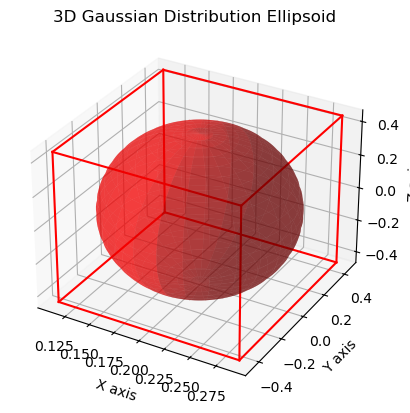

In [148]:
plot_gaussian_ellipsoid(g_r.pos, g_r.cov3D, g_r.bbox ,g_r.iso_color)

[[0.0025 0.     0.    ]
 [0.     1.     0.    ]
 [0.     0.     1.    ]]
[[-0.35 -3.   -3.  ]
 [-0.05 -3.   -3.  ]
 [-0.05  3.   -3.  ]
 [-0.35  3.   -3.  ]
 [-0.35 -3.    3.  ]
 [-0.05 -3.    3.  ]
 [-0.05  3.    3.  ]
 [-0.35  3.    3.  ]]


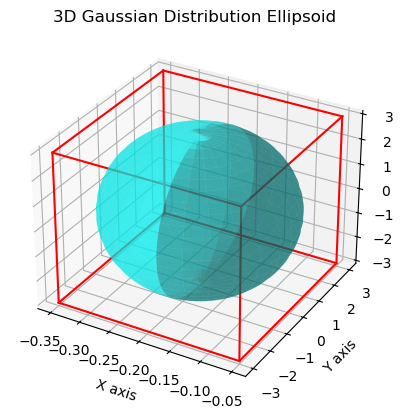

In [137]:
pos_g = [-0.2, 0, 0]
rot_g = np.array([1,0,0,0])
scale_g = np.array([0.05,1,1])
opacity_g = [1]
sh_g = [0,0,0,0]
g_g = Gaussian(pos_g, scale_g, rot_g, opacity_g, sh_g)
g_g.iso_color = np.array([0,1,1]) # cyan
print(g_g.cov3D)
print(g_g.bbox)
plot_gaussian_ellipsoid(g_g.pos, g_g.cov3D, g_g.bbox ,g_g.iso_color)

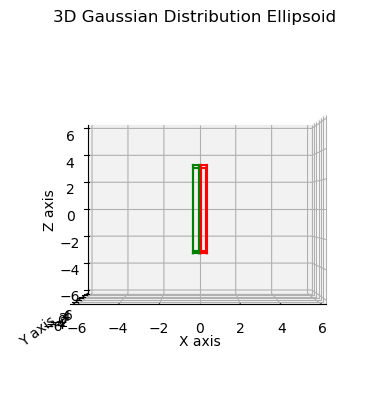

In [138]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

def plot_handcraft_bbox(vertices_r, vertices_g):
 
    # Plotting
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # plot bounding box
    sides = [
        [0, 1], [1, 2], [2, 3], [3, 0],  # Bottom
        [4, 5], [5, 6], [6, 7], [7, 4],  # Top
        [0, 4], [1, 5], [2, 6], [3, 7]   # Sides
    ]

    # Plot each side
    for side in sides:
        xs = vertices_r[side, 0]
        ys = vertices_r[side, 1]
        zs = vertices_r[side, 2]
        ax.plot(xs, ys, zs, color='r')
        xs = vertices_g[side, 0]
        ys = vertices_g[side, 1]
        zs = vertices_g[side, 2]
        ax.plot(xs, ys, zs, color='g')
    
    # Plot settings
    ax.set_xlabel('X axis')
    ax.set_ylabel('Y axis')
    ax.set_zlabel('Z axis')
    plt.title('3D Gaussian Distribution Ellipsoid')
    ax.set_xlim(-6,6)
    ax.set_ylim(-6,6)
    ax.set_zlim(-6,6)
    ax.view_init(0,-90)
    plt.show()

plot_handcraft_bbox(g_r.bbox, g_g.bbox)


There are 2 gaussian blobs in the point cloud


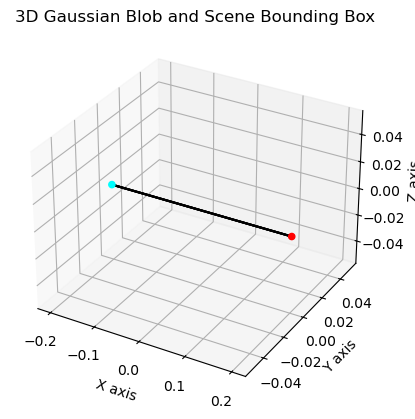

In [139]:
from voxel import build_kd_tree_g_center
from plot_utils import plot_gaussian_scene_bbox
new_scene = [g_r, g_g]
pcd_tree,aabb = build_kd_tree_g_center(new_scene)
plot_gaussian_scene_bbox(new_scene, np.asarray(aabb.get_box_points()), "handcrafted_scene.png")

In [3]:
import torch
import torch.optim as optim

# Example inputs (replace these with your actual values)
# Target albedos
targets = torch.tensor(colors.reshape(-1,3), dtype=torch.float32)
# Ink albedos
ink = np.array([
    [0.05, 0.7, 0.98],  # Cyan
    [0.98, 0.1, 0.9],  # Magenta
    [0.997, 0.995, 0.15],  # Yellow
    [0.35, 0.35, 0.35],  # Black
    [0.9991, 0.9997, 0.999]   # White
    ])
inks = torch.tensor(ink, dtype=torch.float32)

# Number of inks and targets
num_inks = inks.shape[0]
num_targets = targets.shape[0]

# Initialize weights with equal distribution, ensuring they sum to 1
weights = torch.full((num_targets, num_inks), fill_value=1.0 / num_inks, requires_grad=True)

# Optimizer
optimizer = optim.Adam([weights], lr=0.05)
iters = 3000

# Optimization loop
for epoch in range(iters):
    optimizer.zero_grad()
    
    # Predicted albedo is a dot product of weights and inks
    predicted = torch.matmul(weights, inks)
    
    # Loss function (Mean Squared Error)
    loss = torch.mean((predicted - targets) ** 2)
    
    # Backpropagation
    loss.backward()
    
    # Optimizer step
    optimizer.step()
    
    # Project weights back to the simplex (ensure they sum to 1)
    with torch.no_grad():
        weights -= torch.mean(weights, dim=1, keepdim=True) - 1.0 / num_inks
        weights /= torch.sum(weights, dim=1, keepdim=True)

    # Optional: Print loss every 100 epochs
    if epoch % 100 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item()}")

# The final weights are the solution
# print("Optimized weights:", weights)


Epoch 0, Loss: 0.128451868891716
Epoch 100, Loss: 0.11074182391166687
Epoch 200, Loss: 0.09565102308988571
Epoch 300, Loss: 0.08191798627376556
Epoch 400, Loss: 0.0694943368434906
Epoch 500, Loss: 0.05835958570241928
Epoch 600, Loss: 0.04849737137556076
Epoch 700, Loss: 0.03988724946975708
Epoch 800, Loss: 0.03249867260456085
Epoch 900, Loss: 0.02628522366285324
Epoch 1000, Loss: 0.021179260686039925
Epoch 1100, Loss: 0.017089279368519783
Epoch 1200, Loss: 0.013899012468755245
Epoch 1300, Loss: 0.011471862904727459
Epoch 1400, Loss: 0.009659538976848125
Epoch 1500, Loss: 0.00831424631178379
Epoch 1600, Loss: 0.0073020304553210735
Epoch 1700, Loss: 0.006513121537864208
Epoch 1800, Loss: 0.005866840481758118
Epoch 1900, Loss: 0.005310238804668188
Epoch 2000, Loss: 0.004812353756278753
Epoch 2100, Loss: 0.004356895107775927
Epoch 2200, Loss: 0.003935892600566149
Epoch 2300, Loss: 0.003545368555933237
Epoch 2400, Loss: 0.003183028195053339
Epoch 2500, Loss: 0.0028472025878727436
Epoch 2600

In [4]:
torch.save(weights, 'weights.pt')

In [5]:
new_c = torch.matmul(weights, inks)
new_colors = new_c.detach().numpy()
print(new_colors.shape)
new_colors = new_colors.reshape(colors.shape)
print(new_colors.shape)
np.save('new_colors.npy', new_colors)

(585752, 3)
(68, 118, 73, 3)


Ploting voxel representation


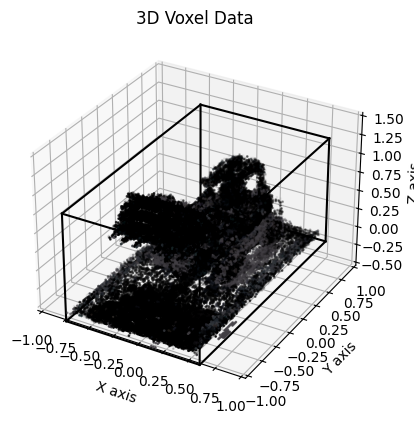

In [6]:
from plot_utils import plot_voxel_data
pos = np.load('pos.npy')
colors = np.load('color.npy')
opacities = np.load('opacity.npy')
diff = np.abs(colors - new_colors)
plot_voxel_data(pos, diff, opacities, filename='diff.png')

Ploting voxel representation


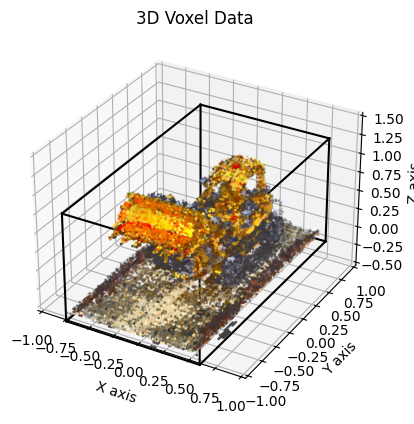

In [9]:
clip_colors = np.clip(new_colors, 0, 1)
plot_voxel_data(pos, clip_colors, opacities, filename='voxel_data_new_ink.png')

In [93]:
albedos = np.array([
    [0.05, 0.7, 0.98],  # Cyan
    [0.98, 0.1, 0.9],  # Magenta
    [0.997, 0.995, 0.15],  # Yellow
    [0.35, 0.35, 0.35],  # KEY: Black
    [0.9991, 0.9997, 0.999],   # White
    [1.0, 1.0, 1.0] #Transparent
    ])
sgima_t_scale_factor = 20
sigma_ts = np.array([[9.0, 4.5, 7.5],  # Cyan
    [2.5, 3.0, 10.0],  # Magenta
    [2.25, 3.75, 19.0],  # Yellow
    [5.0, 5.5, 6.5],  # KEY: Black
    [6.0, 9.0, 24.0],   # White
    [1e-4, 1e-4, 1e-4]] #Transparent
    )/sgima_t_scale_factor

In [94]:
sigma_ts

array([[4.500e-01, 2.250e-01, 3.750e-01],
       [1.250e-01, 1.500e-01, 5.000e-01],
       [1.125e-01, 1.875e-01, 9.500e-01],
       [2.500e-01, 2.750e-01, 3.250e-01],
       [3.000e-01, 4.500e-01, 1.200e+00],
       [5.000e-06, 5.000e-06, 5.000e-06]])

In [ ]:
use_transparent = 0.0

In [98]:
red_weights = np.array([0.0, 1.0, 1.0, 0.0, 0.0, use_transparent]) # CMYKWT
red_weights = red_weights / np.sum(red_weights)
print(red_weights)
red_albedo = np.dot(red_weights, albedos)
red_sigma_t = np.dot(red_weights, sigma_ts)
print("albedo", red_albedo)
print("sigma_t", red_sigma_t)

[0.  0.5 0.5 0.  0.  0. ]
albed [0.9885 0.5475 0.525 ]
sigma_t [0.11875 0.16875 0.725  ]


In [99]:
green_weights = np.array([1.0, 0.0, 1.0, 0.0, 0.0, use_transparent]) # CMYKWT
green_weights = green_weights / np.sum(green_weights)
print(green_weights)
green_albedo = np.dot(green_weights, albedos)
green_sigma_t = np.dot(green_weights, sigma_ts)
print("albedo", green_albedo)
print("sigma_t", green_sigma_t)


[0.5 0.  0.5 0.  0.  0. ]
albed [0.5235 0.8475 0.565 ]
sigma_t [0.28125 0.20625 0.6625 ]


In [149]:
for i in range(3):
    print(i)

0
1
2


In [163]:

#  s / (a + s)
ink_albedo = np.array([
    [0.05, 0.7, 0.98],  # Cyan
    [0.98, 0.1, 0.9],  # Magenta
    [0.997, 0.995, 0.15],  # Yellow
    [0.35, 0.35, 0.35],  # Black
    [0.9991, 0.9997, 0.999],   # White
    [1.0, 1.0, 1.0] #Transparent
    ])

# a + s
ink_sigma_t = np.array([
    [9.0, 4.5, 7.5],  # Cyan
        [2.5, 3.0, 10.0],  # Magenta
        [2.25, 3.75, 19.0],  # Yellow
        [5.0, 5.5, 6.5],  # KEY: Black
        [6.0, 9.0, 24.0],   # White
        [1e-4, 1e-4, 1e-4]] #Transparent
        )


scattering = ink_albedo * ink_sigma_t
absorption = ink_sigma_t - scattering


In [171]:
print(scattering)
print(absorption)

[[4.50000e-01 3.15000e+00 7.35000e+00]
 [2.45000e+00 3.00000e-01 9.00000e+00]
 [2.24325e+00 3.73125e+00 2.85000e+00]
 [1.75000e+00 1.92500e+00 2.27500e+00]
 [5.99460e+00 8.99730e+00 2.39760e+01]
 [1.00000e-04 1.00000e-04 1.00000e-04]]
[[8.550e+00 1.350e+00 1.500e-01]
 [5.000e-02 2.700e+00 1.000e+00]
 [6.750e-03 1.875e-02 1.615e+01]
 [3.250e+00 3.575e+00 4.225e+00]
 [5.400e-03 2.700e-03 2.400e-02]
 [0.000e+00 0.000e+00 0.000e+00]]
[[0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]
 [0. 0. 0.]]
[[0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [1.11022302e-16 1.38777878e-17 0.00000000e+00]
 [1.11022302e-16 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 1.11022302e-16 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00]]


In [170]:
weight = np.array([0.25,0.25,0.5,0.0,0.0,0.0])
final_t = np.dot(weight, absorption + scattering)
print(final_t)
print(final_t/20)

[ 4.     3.75  13.875]
[0.2     0.1875  0.69375]
[0. 0. 0.]


In [168]:
final_albedo = np.dot(weight, scattering) / final_t
print(final_albedo)

[0.46165625 0.7275     0.3972973 ]
